<center><font face='Georgia'> 

# Traitement d'images 101 <font size=2 color ='grey' >(Partie2) </font></center>
![title](TIM.png)
______
                 





> **Fait par :**
 
<font color ='darkblue' > 
   
1. **Ramy HAFDI.**
2. **Med. Mondhir CHAALAL.** </font>

> **Décembre 2021**


*Importer les modules necessaires :*

In [1]:
import numpy as np
import os 
import matplotlib.pyplot as plt
import cmath
import cv2 as cv

# Partie1: Filtrage spatial


## Manipulation1 : Réduction du bruit

I. Lire l'image : 

La taile de l'image est: (512, 512)


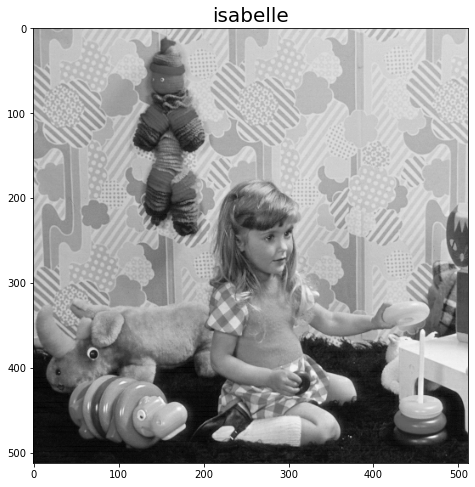

In [38]:
path = 'C:/Users/pc/Desktop/images/isabelle.bmp'
img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2GRAY)
plt.figure(figsize=(8,8))
plt.title('isabelle',fontsize=20)
plt.imshow(img,cmap='gray') 
print("La taile de l'image est: {}".format(img.shape))

II- Rajouter du bruit :

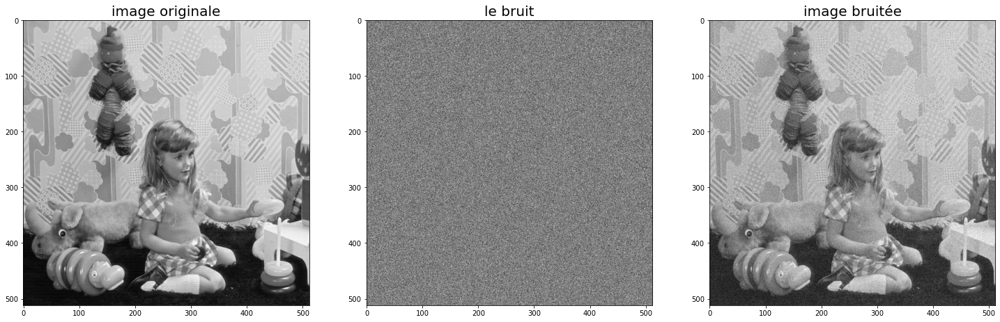

In [39]:
moy = 0
σ = 10
gaussian = np.random.normal( moy , σ , (512, 512))

noisy_image = np.zeros(img.shape, np.float32)

noisy_image = img + gaussian

plt.figure(figsize=(5,5))
plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title('image originale',fontsize=20)

plt.subplot(1,3,2)
plt.imshow(gaussian,cmap='gray')
plt.title('le bruit',fontsize=20)

plt.subplot(1,3,3)
plt.imshow(noisy_image,cmap='gray')
plt.title('image bruitée',fontsize=20)

plt.subplots_adjust(right=4,top=4)

# noisy_image=np.uint8(noisy_image)

In [41]:
print("La taile de l'image bruitée est: {}".format(noisy_image.shape))

La taile de l'image bruitée est: (512, 512)


#### A. Filtre moyenneur :

1- 3x3 :

La taile de l'image filtrée est: (512, 512)


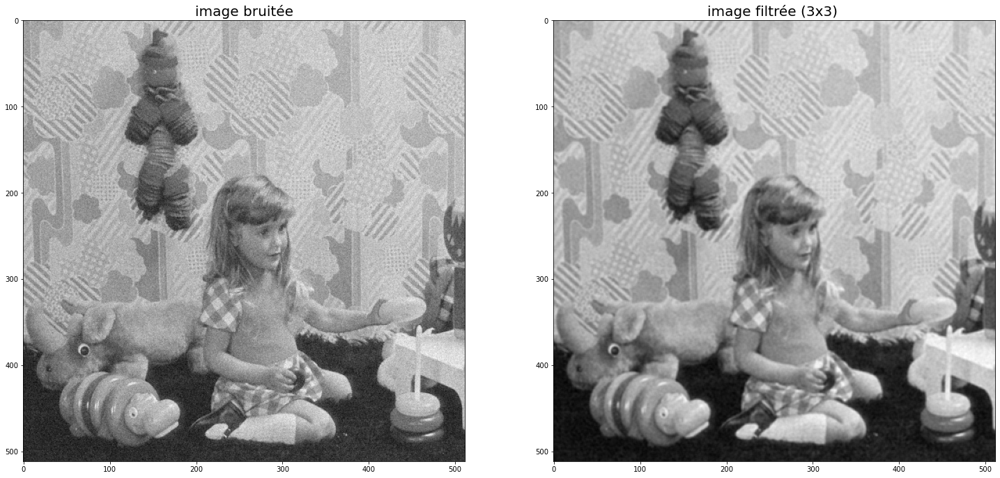

In [40]:
image_filtrée = cv.blur(noisy_image,(3,3))

plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(noisy_image,cmap='gray')
plt.title('image bruitée',fontsize=20)

plt.subplot(1,2,2)
plt.imshow(image_filtrée,cmap='gray')
plt.title('image filtrée (3x3) ',fontsize=20)

plt.subplots_adjust(right=4,top=4)

print("La taile de l'image filtrée est: {}".format(image_filtrée.shape))

**Commentaires :**
* Un **floue léger apparaît sur l’image** après avoir appliquer le filtre moyenneur 3x3.
* l’image obtenu est de taille (512,512).
* les bord n’ont pas étaient traiter mais un floue apparaît.

2- Soubstraction :

(512, 512)

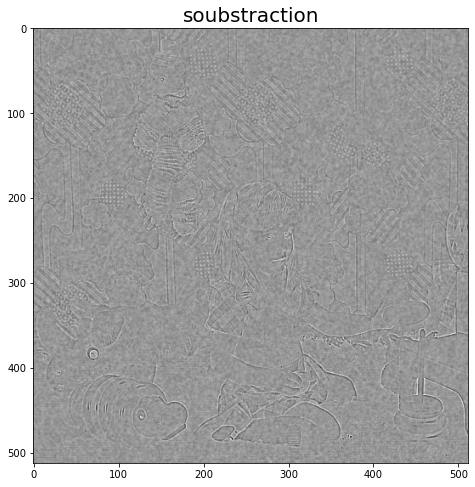

In [42]:
soub = image_filtrée - img
plt.figure(figsize=(8,8))
plt.title('soubstraction',fontsize=20)
plt.imshow(soub,cmap="gray")

soub.shape

**Commentaire :**

Dans l'image de soubstraction on voit que **la différence entre l'image bruitée et l'image filtrée se trouve au niveau des contours**, est c'était la raison pour laquelle on avait vu l'image filtrée floue et on avais perdu beacoup de détailles  après le filtrage.

3- Refaire les memes étapes pour les filtres **5x5**, **6x6** et **7x7** :

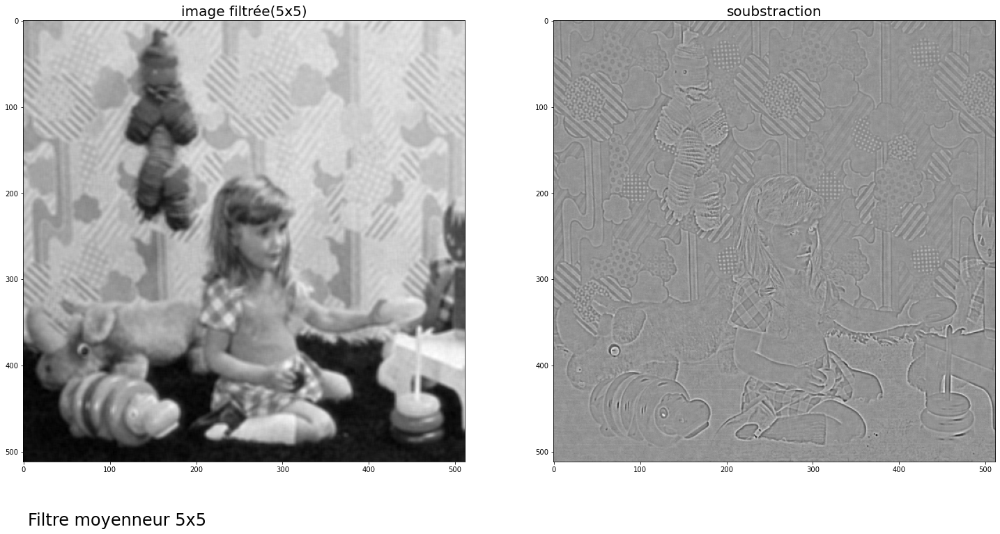

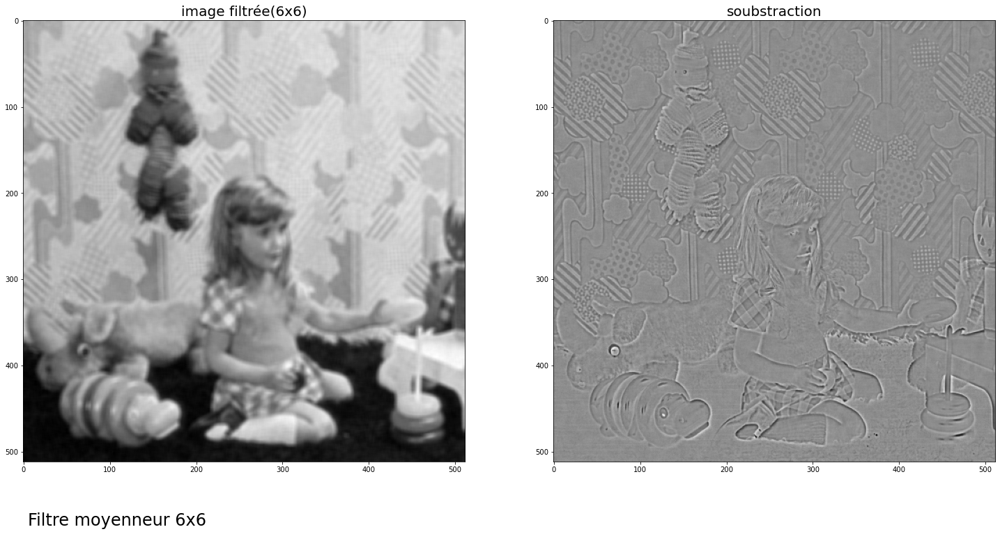

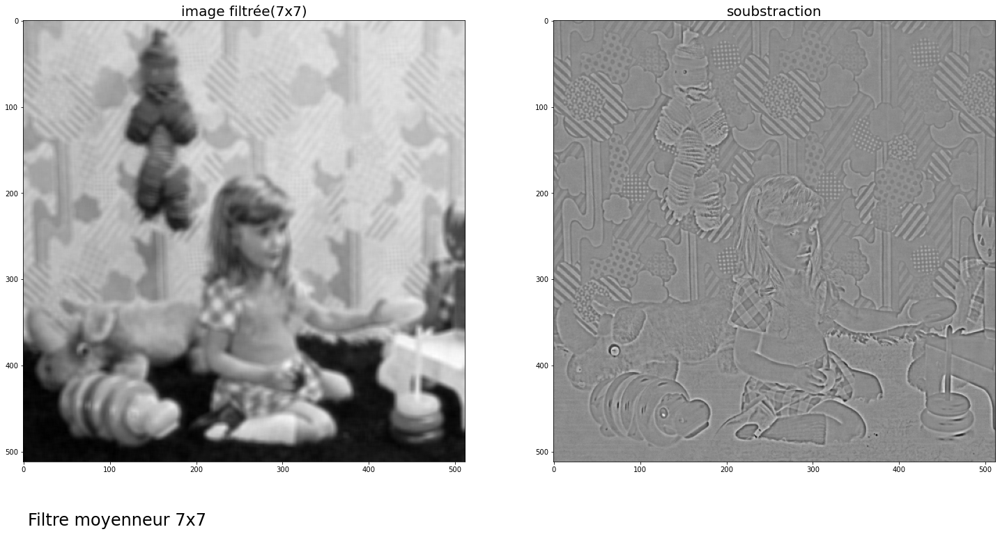

In [43]:
for i in range (5,8) :
    
    image_filtrée = cv.blur(noisy_image,(i,i))
    soub = image_filtrée - img
    
    plt.figure(figsize=(5,5))
    plt.subplot(1,2,1)
    plt.imshow(image_filtrée,cmap='gray')
    plt.title('image filtrée({}x{})'.format(i,i),fontsize=20) 

    plt.subplot(1,2,2)
    plt.title('soubstraction',fontsize=20)
    plt.imshow(soub,cmap="gray")   
    plt.subplots_adjust(right=4,top=4)
    plt.suptitle('Filtre moyenneur {}x{}'.format(i,i), fontsize=24)

**Conclusion:**

Nous remarquant que plus on augmente la taille du filtre moyenneur plus l’image devient plus floue et plus on perd de
détailles ce qui nous conduit à déduire que le filtre moyenneur n’est as le plus adapte pour éliminer le bruit gaussien.


___________________

#### B. Filtre gaussien :

1- Realisation d'un filtrage gaussien **3x3** et **σ = 1** :

La taile de l'image filtrée gaussien est: (512, 512)


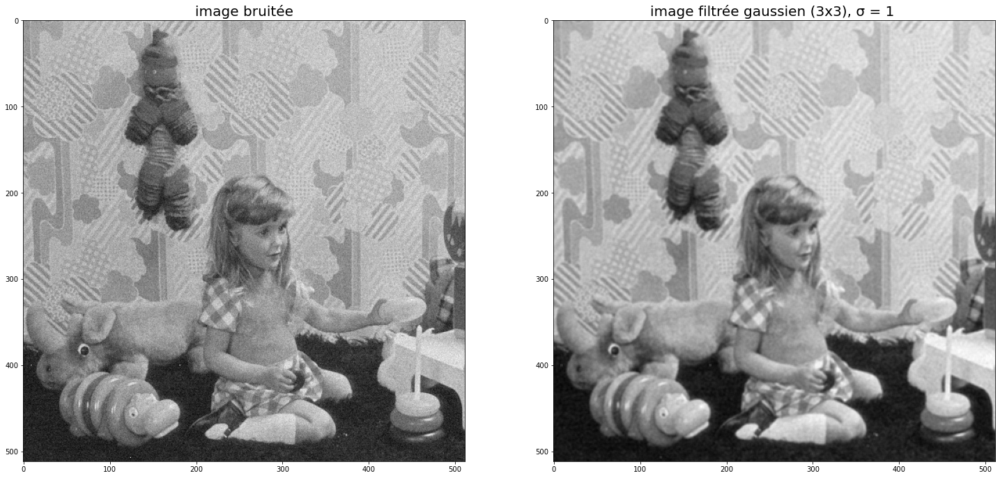

In [8]:
image_gaus = cv.blur(noisy_image,(3,3),1)

plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(noisy_image,cmap='gray')
plt.title('image bruitée',fontsize=20)

plt.subplot(1,2,2)
plt.imshow(image_gaus,cmap='gray')
plt.title('image filtrée gaussien (3x3), σ = 1 ',fontsize=20)

plt.subplots_adjust(right=4,top=4)

print("La taile de l'image filtrée gaussien est: {}".format(image_filtrée.shape))

Les bord ont bien était traites on remarque l’apparition d’un floue léger mais le filtre gaussien reste le plus adapter pour traité le bruit gaussien.

2- a) On etudie **l'influence de la valeur de σ** :
> On applique le meme filtre 3x3 pour une valeur d'écart type égale à 10, et on fait la soubstraction entre les deux images filtrées avec des differents écarts type.

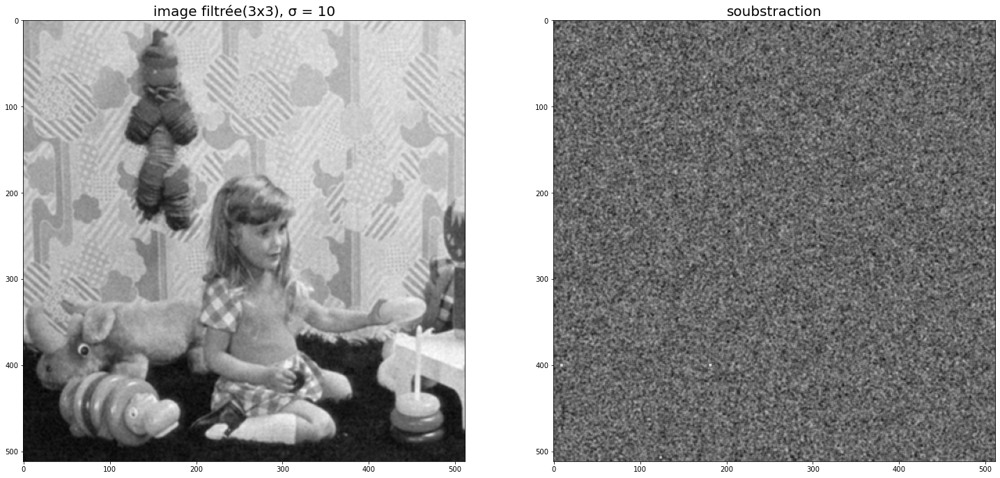

In [47]:
image_gaus1 = cv.blur(noisy_image,(3,3),10)
soub1 = image_gaus - image_gaus1

plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(image_gaus1,cmap='gray')
plt.title('image filtrée(3x3), σ = 10',fontsize=20)

plt.subplot(1,2,2)
plt.imshow(soub1,cmap='gray')
plt.title('soubstraction',fontsize=20)

plt.subplots_adjust(right=4,top=4)

2- b) On etudie **l'influence de la taille du filtre** :
> On applique un filtre avec la meme valeur d'écart type qui égale à 1 et de diffrente taille (7x7), et on fait la soubstraction entre les deux images filtrées avec des differentes tailles de filtre.

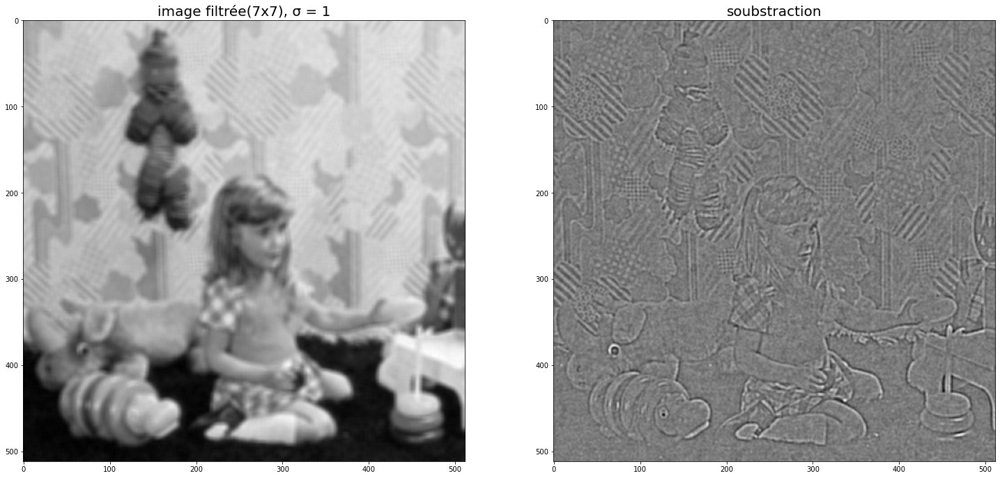

In [48]:
image_gaus2 = cv.blur(noisy_image,(7,7),1)
soub1 = image_gaus - image_gaus2

plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(image_gaus2,cmap='gray')
plt.title('image filtrée(7x7), σ = 1',fontsize=20)

plt.subplot(1,2,2)
plt.imshow(soub1,cmap='gray')
plt.title('soubstraction',fontsize=20)

plt.subplots_adjust(right=4,top=4)

**On conclue que:**
* La valeur de l'ecart type n'a pas une grande influence sur cette experiance. 
* plus on augmente la taille plus l’image devient plus floue est perd en détails.

3- Le filtre qui semble le meilleur est celui de taille **3x3**, avec **σ = 1**:

Le soubstraction avec l'image originale :

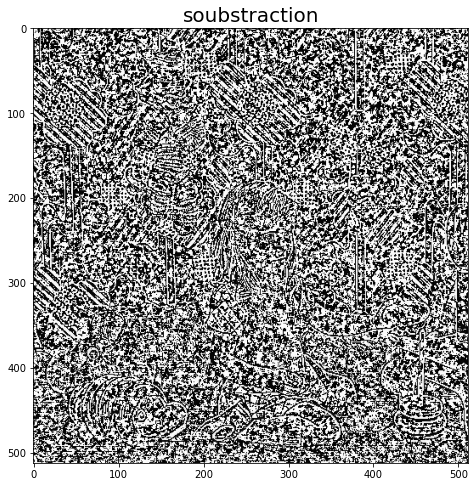

In [49]:
soub = image_gaus - img
plt.figure(figsize=(8,8))
plt.title('soubstraction',fontsize=20)
plt.imshow(soub,cmap="gray")

De l’image de différence on conclue que le filtre gaussien est le plus adequate pour un bruit gaussien.

____

#### C. Filtre mediane :
1- Filtre median de taille **3x3**, **5x5**, **7x7** et **9x9** :

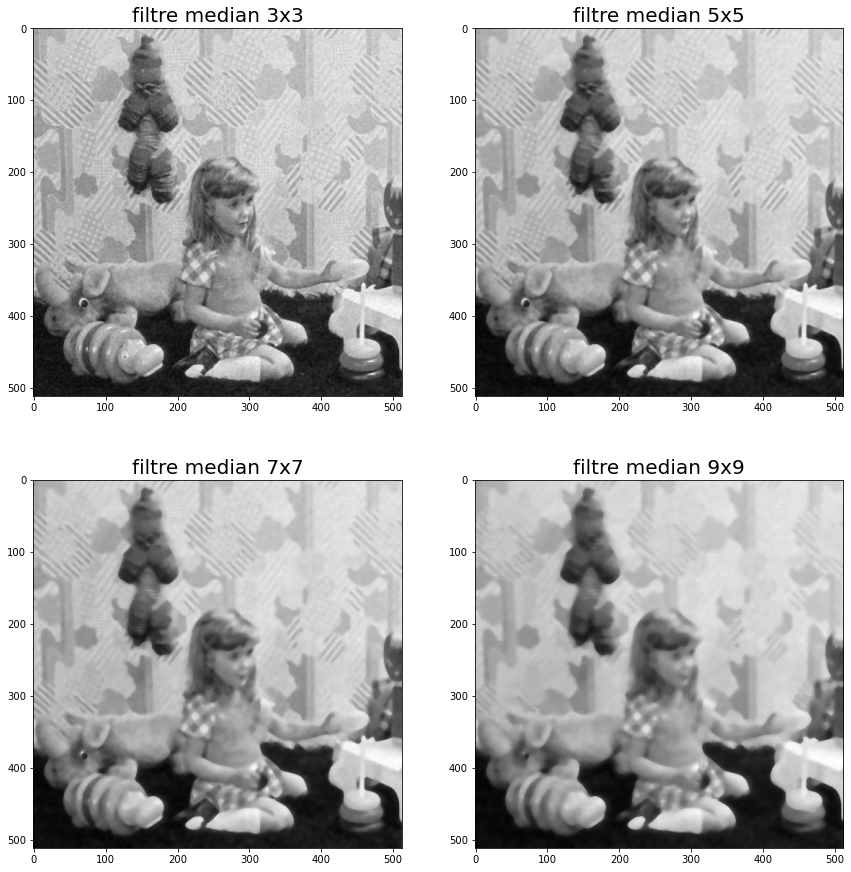

In [12]:
m=[3,5,7,9]

for i,f in enumerate(m) :
    image_med = cv.medianBlur(noisy_image,f)
    plt.subplot(2,2,i+1)
    plt.imshow(image_med,cmap='gray')
    plt.title('filtre median {}x{}'.format(f,f),fontsize=20)

plt.subplots_adjust(right=2,top=3)

3- Comparaison :

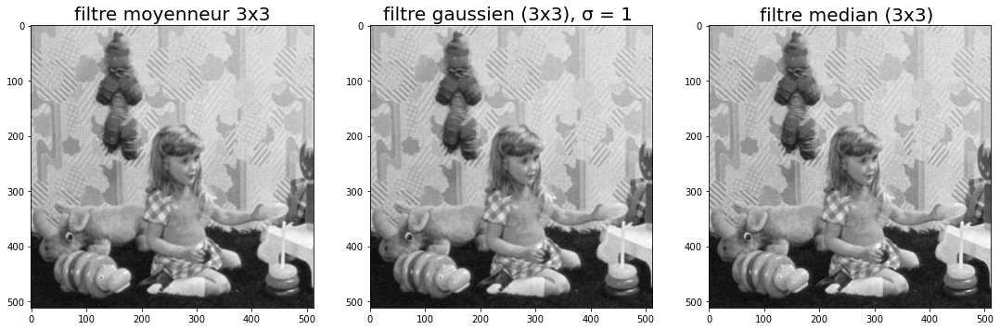

In [13]:
f1_moy = cv.blur(noisy_image,(3,3))
f1_gaus = cv.blur(noisy_image,(3,3),1)
f1_med =cv.medianBlur(noisy_image,3)

plt.figure(figsize=(5,5))
plt.subplot(1,3,1)
plt.imshow(f1_moy,cmap='gray')
plt.title('filtre moyenneur 3x3',fontsize=20)

plt.subplot(1,3,2)
plt.imshow(f1_gaus,cmap='gray')
plt.title('filtre gaussien (3x3), σ = 1 ',fontsize=20)

plt.subplot(1,3,3)
plt.imshow(f1_med,cmap='gray')
plt.title('filtre median (3x3) ',fontsize=20)

plt.subplots_adjust(right=3,top=3)

**Commentaire:**

Le filtre median est bien adapté à traiter les bords, mais laisse plus de floue plus on augmente sa taille.

2- Le filtre le plus adapté est le filtre median 3x3.


______

III. **Le filtre gaussien construit l’image la plus claire** ce qui montre qu’il est le plus adapté à éliminer un bruits gaussien.

IV. Bruit impulsionnel :

In [14]:
import random 

def br_impls(image,a):
    output = np.zeros(image.shape,np.uint8)
    b = 1 - a 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < a :
                output[i][j] = 0
            elif rdn > b :
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

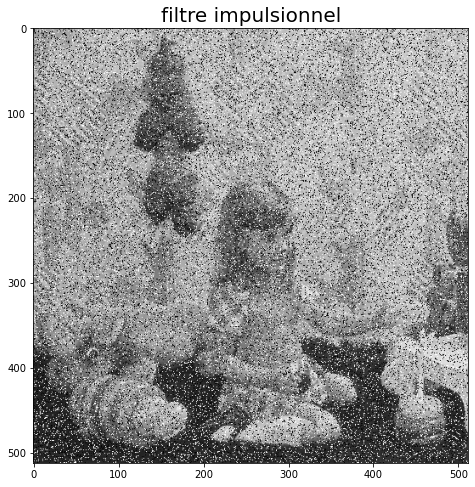

In [15]:
img_impls = br_impls(img,0.1)
plt.figure(figsize=(8,8))
plt.title('filtre impulsionnel',fontsize=20)
plt.imshow(img_impls,cmap="gray")

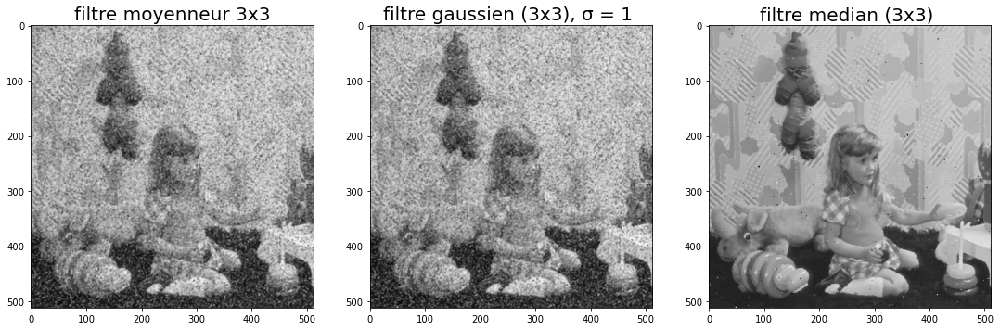

In [16]:
f_moy = cv.blur(img_impls,(3,3))
f_gaus = cv.blur(img_impls,(3,3),1)
f_med =cv.medianBlur(img_impls,3)

plt.figure(figsize=(5,5))
plt.subplot(1,3,1)
plt.imshow(f_moy,cmap='gray')
plt.title('filtre moyenneur 3x3',fontsize=20)

plt.subplot(1,3,2)
plt.imshow(f_gaus,cmap='gray')
plt.title('filtre gaussien (3x3), σ = 1 ',fontsize=20)

plt.subplot(1,3,3)
plt.imshow(f_med,cmap='gray')
plt.title('filtre median (3x3) ',fontsize=20)

plt.subplots_adjust(right=3,top=3)

**Remarque:**

on remarque que le filtre median est le plus convenable pour éliminer les bruits impulsionnels.

V. Augmenter le pourcentage de pixels remplacés :

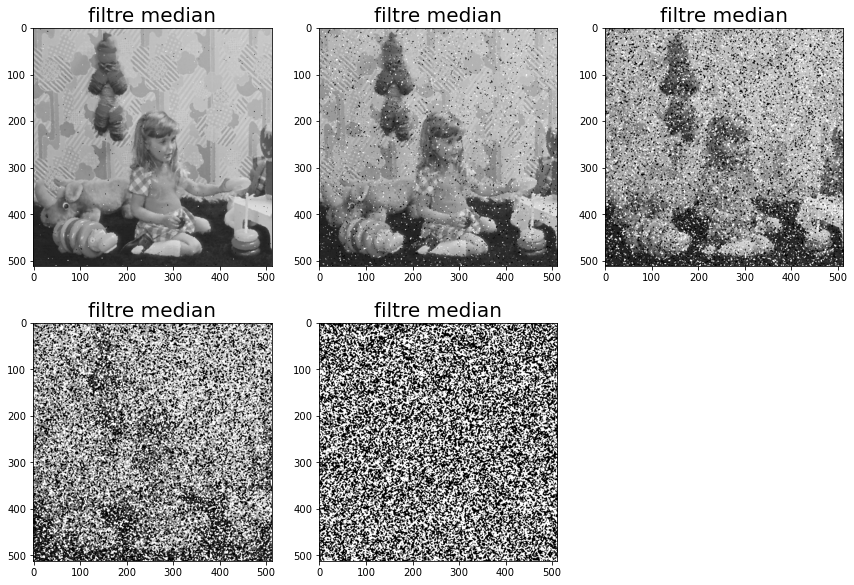

In [17]:
m=[0.1,0.2,0.3,0.4,0.5]

for i,f in enumerate(m) :
    im_im = br_impls(img,f)
    fil_im= cv.medianBlur(im_im,3)
    plt.subplot(2,3,i+1)
    plt.imshow(fil_im,cmap='gray')
    plt.title('filtre median',fontsize=20)

plt.subplots_adjust(right=2,top=2)

* Le filtre median a atteint ses limites et ne devient plus efficace contre un filtre impulsionnel de haut pourcentage.
* A partir de 30% l'influence du filtre mediane diminue.

_____

## Manipulation2 : Détection de contours

1. Lire l'image : 

La taile de l'image est: (512, 512, 3)


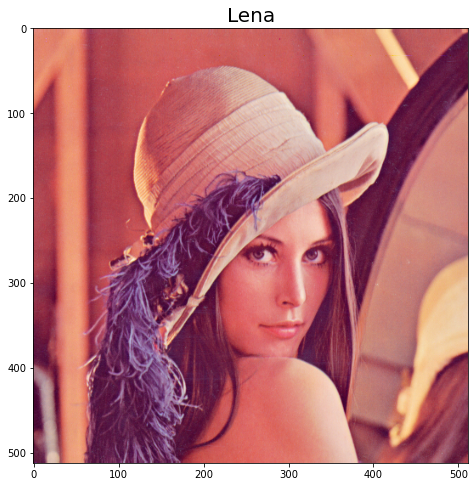

In [18]:
path = 'C:/Users/pc/Desktop/images/lena.png'
img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
plt.figure(figsize=(8,8))
plt.title('Lena',fontsize=20)
plt.imshow(img) 
print("La taile de l'image est: {}".format(img.shape))

2. Convertir l'image en niveaux de gris:

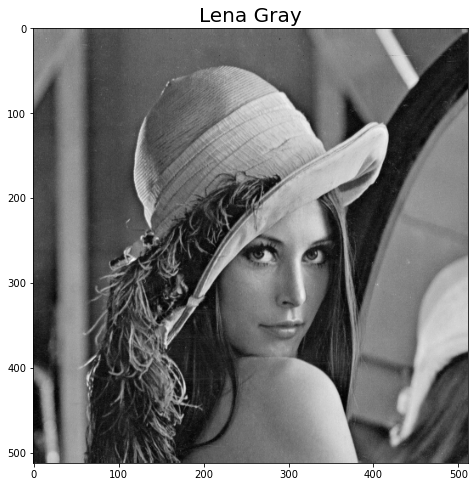

In [19]:
img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
plt.figure(figsize=(8,8))
plt.title('Lena Gray',fontsize=20)
plt.imshow(img,cmap='gray') 

3. Les filtres **"Roberts"**, **"Perwitt"** et **"Sobel"** :

<ipython-input-23-a12dda94a79f>:23: RuntimeWarning: divide by zero encountered in true_divide
  phase = np.arctan(Y / X).astype(np.uint8)
<ipython-input-23-a12dda94a79f>:23: RuntimeWarning: invalid value encountered in true_divide
  phase = np.arctan(Y / X).astype(np.uint8)


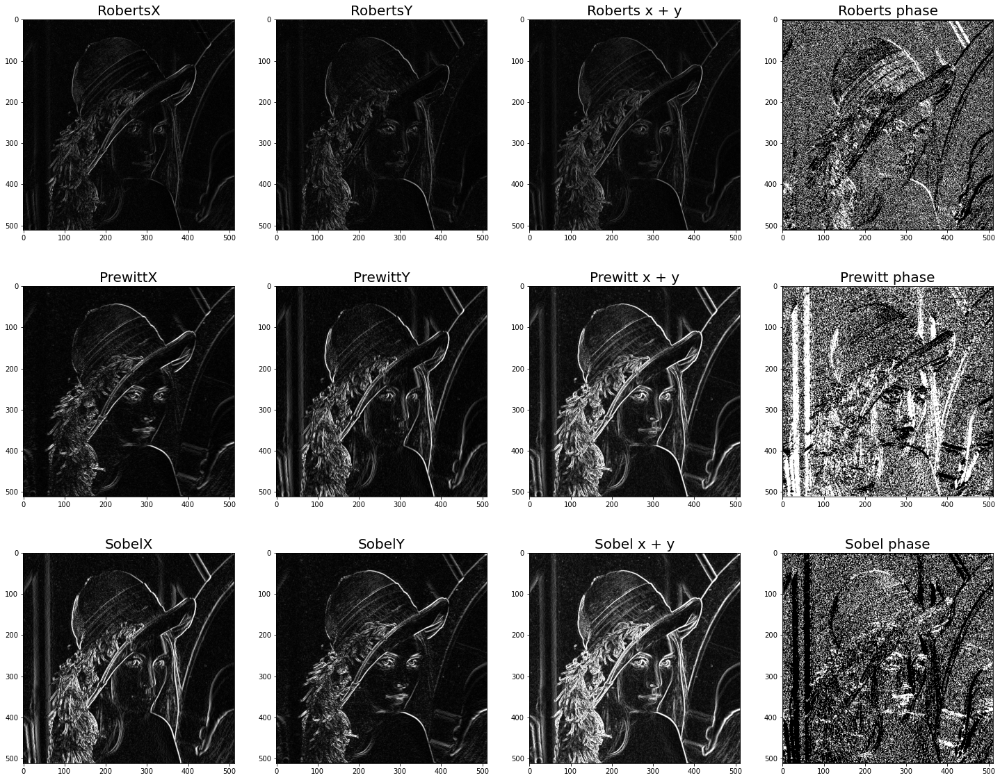

In [23]:
plt.figure(figsize = (25, 20))

kernel = {
    'Roberts': {
        'kernx': np.array([[-1, 0], [0, 1]], dtype=int),
        'kerny': np.array([[0, -1], [1, 0]], dtype=int),},
    'Prewitt': {
        'kernx': np.array([[1,1,1],[0,0,0],[-1,-1,-1]],dtype=int),
        'kerny': np.array([[-1,0,1],[-1,0,1],[-1,0,1]],dtype=int),},
    'Sobel': '',}
i = 0
for n , kernel in kernel.items():
    if n == 'Sobel':
        x = cv.Sobel(img, cv.CV_16S, 1, 0)
        y = cv.Sobel(img, cv.CV_16S, 0, 1)
    else:
        x = cv.filter2D(img, cv.CV_16S, kernel['kernx'])
        y = cv.filter2D(img, cv.CV_16S, kernel['kerny']) 

    X = cv.convertScaleAbs(x).astype(np.uint8)
    Y = cv.convertScaleAbs(y).astype(np.uint8)
    module = cv.addWeighted(X, 1, Y, 1, 0)
    phase = np.arctan(Y / X).astype(np.uint8)

    plt.subplot(3, 4, 4*i + 1)
    plt.imshow(X, cmap="gray")
    plt.title( n + 'X',fontsize=20)

    plt.subplot(3, 4, 4*i + 2)
    plt.imshow(Y, cmap="gray")
    plt.title( n + 'Y',fontsize=20)

    plt.subplot(3, 4, 4*i + 3)
    plt.imshow(module, cmap="gray")
    plt.title( n + ' x + y',fontsize=20)

    plt.subplot(3, 4, 4*i + 4)
    plt.imshow(phase, cmap="gray")
    plt.title( n + ' phase',fontsize=20)

    i=i+1

e- Comparaison:

Nous pouvons remarquer que le **filtre Sobel a des contours solides** malgre **l'existance un peu de bruit** par rapport aux autres filtre, et **Prewitt plus efficace que Roberts.**

4. Filtre Laplacien :

Text(0.5, 1.0, '8-connexité')

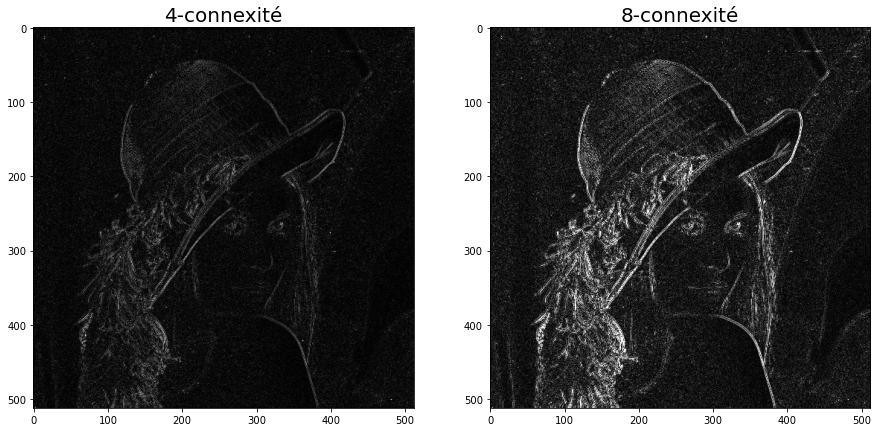

In [24]:
plt.figure(figsize = (15, 15))

kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]],dtype=int)

dst = cv.filter2D(img, cv.CV_16S, kernel)
l4c = cv.convertScaleAbs(dst)

plt.subplot(1, 2, 1)
plt.imshow(l4c, cmap="gray")
plt.title('4-connexité',fontsize=20)

kernel = np.array([[1,1,1],[1,-8,1],[1,1,1]],dtype=int)

dst = cv.filter2D(img, cv.CV_16S, kernel)
l8c = cv.convertScaleAbs(dst)

plt.subplot(1, 2, 2)
plt.imshow(l8c, cmap="gray")
plt.title('8-connexité',fontsize=20)

Comparaison:

**8 connexités** définit mieux **les contours** mais avec beacoup de **bruit.**

5. Amelioration du filtre Laplacien :

Text(0.5, 1.0, '8 connexité amélioré')

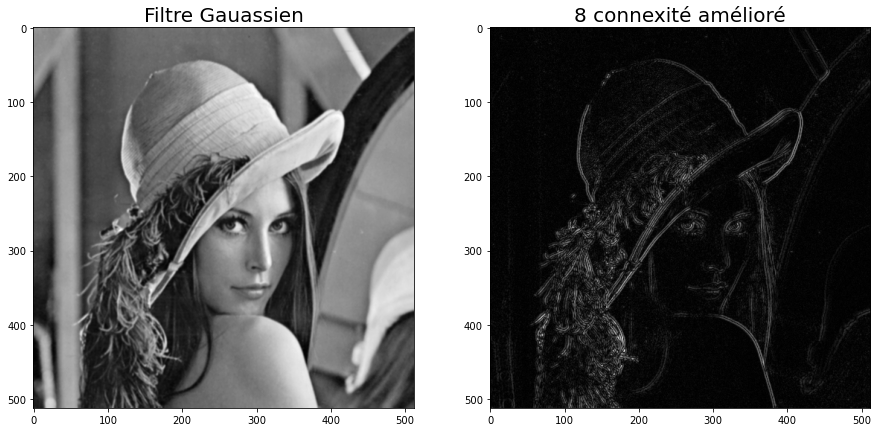

In [25]:
plt.figure(figsize = (15, 15))

img_gauss = cv.GaussianBlur(img, (3, 3), 1)

plt.subplot(1, 2, 1)
plt.imshow(img_gauss, cmap="gray")
plt.title('Filtre Gauassien',fontsize=20)

kernel = np.array([[1,1,1],[1,-8,1],[1,1,1]],dtype=int)

dst = cv.filter2D(img_gauss, cv.CV_16S, kernel)
l8c = cv.convertScaleAbs(dst)

plt.subplot(1, 2, 2)
plt.imshow(l8c, cmap="gray")
plt.title('8 connexité amélioré',fontsize=20)

6. Amélioration du Laplacien par seuillage :

Text(0.5, 1.0, '8 connexité amélioré par seuillage')

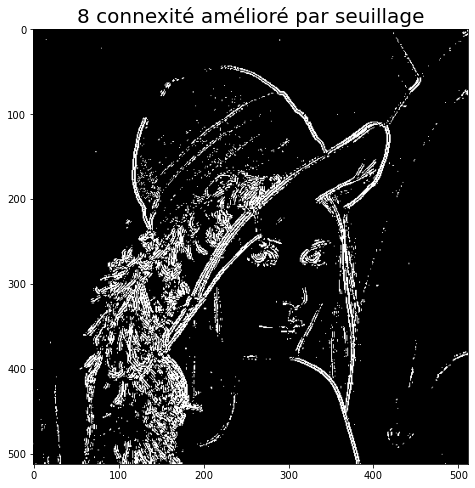

In [26]:
ret, Lap_blur_th = cv.threshold(l8c,0, 255, cv.THRESH_OTSU )
plt.figure(figsize=(8,8))
plt.imshow(Lap_blur_th, cmap="gray")
plt.title('8 connexité amélioré par seuillage',fontsize=20)

Comparasion :

- Le **filtrage Laplacien avec un filtre gaussien**, donne un meilleur résultat qu'avec le Laplacien uniquement 
- Apres le seuillage, nous obtenons **un résultat plus correct au niveau des contours.**
______

# Filtrage Fréquentiel


1. Lire l'image :

La taile de l'image est: (576, 720, 3)


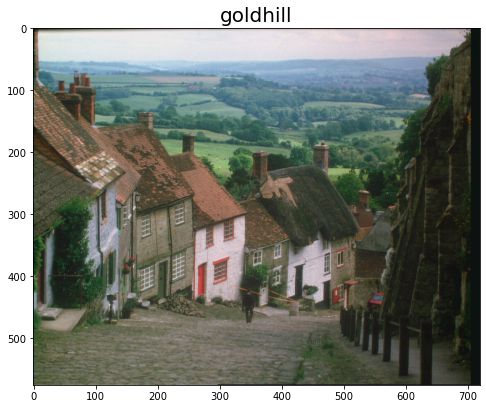

In [27]:
path = 'C:/Users/pc/Desktop/images/goldhill.bmp'
img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
plt.figure(figsize=(8,8))
plt.title('goldhill',fontsize=20)
plt.imshow(img) 
print("La taile de l'image est: {}".format(img.shape))

2. Convertir en niveaux des gris:

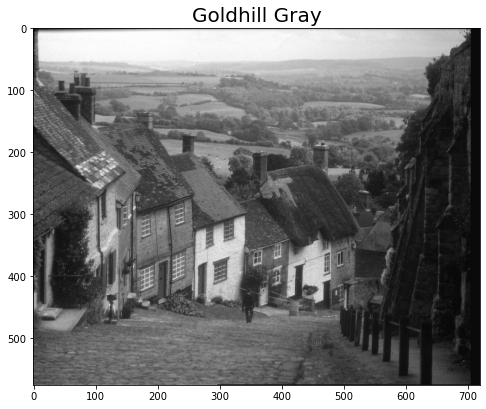

In [28]:
img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
plt.figure(figsize=(8,8))
plt.title('Goldhill Gray',fontsize=20)
plt.imshow(img,cmap='gray') 

3. Bruit gaussien à l’image de moyenne nulle et d’écart-type σ = 0.01 :

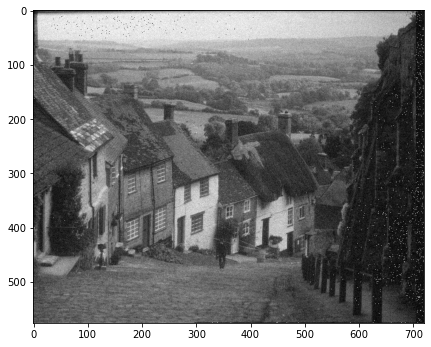

In [29]:
plt.figure(figsize=(7, 7))

moy = 0
σ = 10

gaussian = np.random.normal(moy,σ, img.shape)

img_br = (img+ gaussian).astype(np.uint8)
plt.imshow(img_br.astype(np.uint8), cmap="gray")

4. Transformée de Fourier discrète de l’image :

Text(0.5, 1.0, 'Transformée de Fourier discrète')

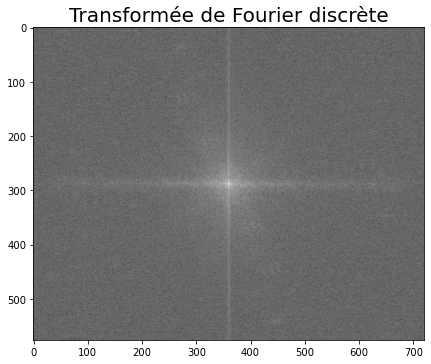

In [30]:
plt.figure(figsize=(7, 7))

f = np.fft.fft2(img_br)
fshift = np.fft.fftshift(f)
ms = 20 * np.log(np.abs(fshift))

plt.imshow(ms, cmap='gray')
plt.title('Transformée de Fourier discrète',fontsize=20)

6. Afficher la fonction de transfert du filtre H:

Text(0.5, 1.0, 'fonction de transfert')

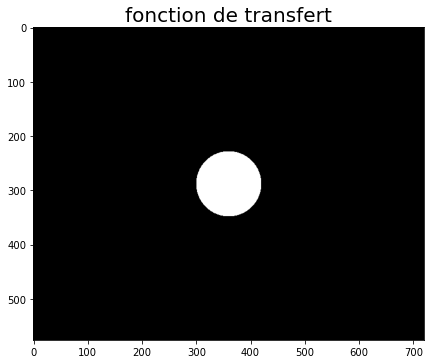

In [31]:
plt.figure(figsize=(7, 7))
nl, nc = img_br.shape

D0 = 60
x = np.arange(-nl/2, nl/2, 1)
y = np.arange(-nc/2, nc/2, 1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx * xx + yy * yy)
H = z < D0

plt.imshow(H, cmap='gray')
plt.title('fonction de transfert',fontsize=20)

7. Multiplier le spectre de l’image f par la fonction de transfert H :

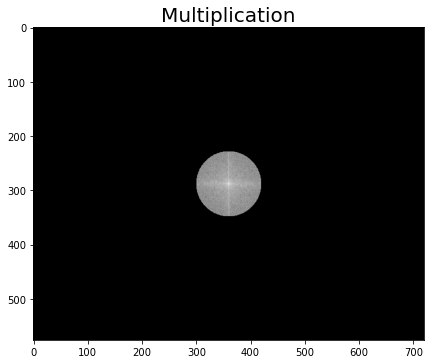

In [34]:
filter_passe_bas = ms * H
plt.figure(figsize=(7, 7))
plt.title('Multiplication',fontsize=20)
plt.imshow(filter_passe_bas, cmap='gray')

8. Réalisation de la transformée de Fourier inverse:

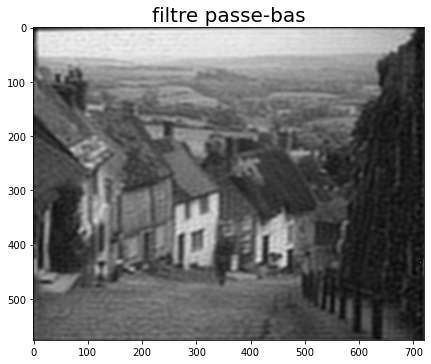

In [35]:
f_ishift = np.fft.ifftshift(fshift*H)
img_back = np.fft.ifft2(f_ishift)
img_back = np.real(img_back)
img_back=np.uint8(img_back)
plt.figure(figsize=(7, 7))
plt.title('filtre passe-bas',fontsize=20)
plt.imshow(img_back,cmap='gray')
plt.show()

10. Filtre passe-haut :

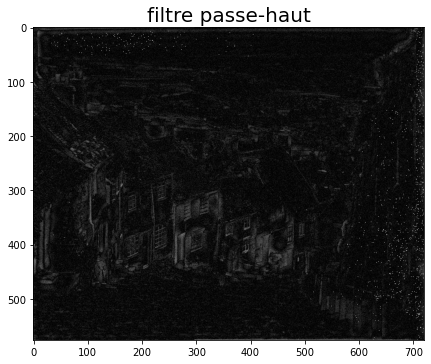

In [36]:
D0 = 20
x = np.arange(-nl/2, nl/2, 1)
y = np.arange(-nc/2, nc/2, 1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx * xx + yy * yy)
H = z > D0

filter_passe_haut = ms * H

f_ishift = np.fft.ifftshift(fshift*H)
img_back = np.fft.ifft2(f_ishift)
img_back = np.absolute(img_back)
img_back = np.uint8(img_back)

plt.figure(figsize=(7, 7))
plt.title('filtre passe-haut',fontsize=20)
plt.imshow(img_back,cmap='gray')

11. Filtre passe-bande :

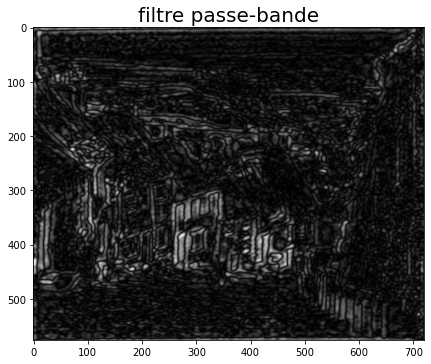

In [37]:
D0 = 20
D1 = 80
x = np.arange(-nl/2, nl/2, 1)
y = np.arange(-nc/2, nc/2, 1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx * xx + yy * yy)
H = (D0 < z) & (z < D1)

filter_passe_bande = ms * H

f_ishift = np.fft.ifftshift(fshift*H)
img_back = np.fft.ifft2(f_ishift)
img_back = np.absolute(img_back)
img_back = np.uint8(img_back)

plt.figure(figsize=(7, 7))
plt.title('filtre passe-bande',fontsize=20)
plt.imshow(img_back,cmap='gray')

Conclusion :

* Filtrage fréquentiel qui consiste à filtrer une image en modifiant son spectre, et basé sur la TFD et TFD inverse (la multipication par une fonction H)
*   Le filtrage passe bande laissee une bande de fréquences voulues.
*   Le filtrage passe haut sert à couper les basses fréquences.